In [1]:
import pandas as pd
import numpy as np
#%pip install seaborn
import seaborn as sns
#%pip install matplotlib
import matplotlib.pyplot as plt
#%pip install plotly
%matplotlib inline
%matplotlib notebook #using "%matplotlib notebook"to get interactive plots in notebook running on firefox browser stopped working upon upgrade 
                     #from matplotlib 3.1.1 to 3.3.1. Firefox 68.0.1 (64-bit), used this code below to resolved problem
import matplotlib
import matplotlib.pyplot as plt
fig,ax=plt.subplots()
ax.plot([0,1,2],[1.1,2.3,4],'o');
print(matplotlib.__version__)
import plotly.express as px

<IPython.core.display.Javascript object>

3.10.5


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
data=pd.read_csv('cybersecurity_attacks.csv')
data.head().T

,0,1,2,3,4
Timestamp,2023-05-30 06:33:58,2020-08-26 07:08:30,2022-11-13 08:23:25,2023-07-02 10:38:46,2023-07-16 13:11:07
Source IP Address,103.216.15.12,78.199.217.198,63.79.210.48,163.42.196.10,71.166.185.76
Destination IP Address,84.9.164.252,66.191.137.154,198.219.82.17,101.228.192.255,189.243.174.238
Source Port,31225,17245,16811,20018,6131
Destination Port,17616,48166,53600,32534,26646
Protocol,ICMP,ICMP,UDP,UDP,TCP
Packet Length,503,1174,306,385,1462
Packet Type,Data,Data,Control,Data,Data
Traffic Type,HTTP,HTTP,HTTP,HTTP,DNS
Payload Data,Qui natus odio asperiores nam. Optio nobis ius...,Aperiam quos modi officiis veritatis rem. Omni...,Perferendis sapiente vitae soluta. Hic delectu...,Totam maxime beatae expedita explicabo porro l...,Odit nesciunt dolorem nisi iste iusto. Animi v...


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Timestamp               40000 non-null  object 
 1   Source IP Address       40000 non-null  object 
 2   Destination IP Address  40000 non-null  object 
 3   Source Port             40000 non-null  int64  
 4   Destination Port        40000 non-null  int64  
 5   Protocol                40000 non-null  object 
 6   Packet Length           40000 non-null  int64  
 7   Packet Type             40000 non-null  object 
 8   Traffic Type            40000 non-null  object 
 9   Payload Data            40000 non-null  object 
 10  Malware Indicators      20000 non-null  object 
 11  Anomaly Scores          40000 non-null  float64
 12  Alerts/Warnings         19933 non-null  object 
 13  Attack Type             40000 non-null  object 
 14  Attack Signature        40000 non-null

In [5]:
data.columns

Index(['Timestamp', 'Source IP Address', 'Destination IP Address',
       'Source Port', 'Destination Port', 'Protocol', 'Packet Length',
       'Packet Type', 'Traffic Type', 'Payload Data', 'Malware Indicators',
       'Anomaly Scores', 'Alerts/Warnings', 'Attack Type', 'Attack Signature',
       'Action Taken', 'Severity Level', 'User Information',
       'Device Information', 'Network Segment', 'Geo-location Data',
       'Proxy Information', 'Firewall Logs', 'IDS/IPS Alerts', 'Log Source'],
      dtype='object')

In [6]:
data.shape

(40000, 25)

In [7]:
data.isnull().sum().sort_values(ascending=False)

Alerts/Warnings           20067
IDS/IPS Alerts            20050
Malware Indicators        20000
Firewall Logs             19961
Proxy Information         19851
Source IP Address             0
Destination IP Address        0
Source Port                   0
Timestamp                     0
Traffic Type                  0
Packet Type                   0
Packet Length                 0
Protocol                      0
Destination Port              0
Attack Type                   0
Payload Data                  0
Anomaly Scores                0
Severity Level                0
Action Taken                  0
Attack Signature              0
User Information              0
Geo-location Data             0
Network Segment               0
Device Information            0
Log Source                    0
dtype: int64

<span style="color:green"> There are 5 columns with null values. </span>

<span style="color: Purple">Data Cleaning</span>

Deleting null values:

In [8]:
data['Alerts/Warnings'].unique()

array([nan, 'Alert Triggered'], dtype=object)

In [9]:
def categorize_alerts(row):
    if row['Alerts/Warnings'] =="Alert Triggered":
        return 'Alert Triggered'
    else:
        return 'None'

data['Alerts/Warnings'] = data.apply(categorize_alerts, axis=1)
data['Alerts/Warnings']

0                   None
1                   None
2        Alert Triggered
3        Alert Triggered
4        Alert Triggered
              ...       
39995               None
39996               None
39997               None
39998    Alert Triggered
39999    Alert Triggered
Name: Alerts/Warnings, Length: 40000, dtype: object

In [10]:
data['IDS/IPS Alerts'].unique()

array([nan, 'Alert Data'], dtype=object)

In [11]:
data['IDS/IPS Alerts'] = data['IDS/IPS Alerts'].apply(lambda x: 'No Data' 
                                                  if pd.isna(x) 
                                                  else x)
data['IDS/IPS Alerts'].unique()

array(['No Data', 'Alert Data'], dtype=object)

In [12]:
data['Malware Indicators'].unique()

array(['IoC Detected', nan], dtype=object)

In [13]:
data['Malware Indicators'] = data['Malware Indicators'].apply(lambda x: 'No Detection'
                                                         if pd.isna(x)
                                                         else x)
data['Malware Indicators'].unique()

array(['IoC Detected', 'No Detection'], dtype=object)

In [14]:
data['Firewall Logs'] = data['Firewall Logs'].apply(lambda x: 'No Data'
                                               if pd.isna(x)
                                               else x)
data['Firewall Logs'].unique()

array(['Log Data', 'No Data'], dtype=object)

In [15]:
data['Proxy Information'].unique()

array(['150.9.97.135', nan, '114.133.48.179', ..., '60.51.30.46',
       '137.76.130.8', '112.169.115.139'], shape=(20149,), dtype=object)

In [16]:
data['Proxy Information'] = data['Proxy Information'].apply(lambda x: 'No Proxy Data'
                                                       if pd.isna(x)
                                                       else x)
data['Proxy Information'].unique()

array(['150.9.97.135', 'No Proxy Data', '114.133.48.179', ...,
       '60.51.30.46', '137.76.130.8', '112.169.115.139'],
      shape=(20149,), dtype=object)

In [17]:
data.isnull().sum().sort_values(ascending=False)

Timestamp                 0
Source IP Address         0
Destination IP Address    0
Source Port               0
Destination Port          0
Protocol                  0
Packet Length             0
Packet Type               0
Traffic Type              0
Payload Data              0
Malware Indicators        0
Anomaly Scores            0
Alerts/Warnings           0
Attack Type               0
Attack Signature          0
Action Taken              0
Severity Level            0
User Information          0
Device Information        0
Network Segment           0
Geo-location Data         0
Proxy Information         0
Firewall Logs             0
IDS/IPS Alerts            0
Log Source                0
dtype: int64

In [18]:
data['Device Information']

0        Mozilla/5.0 (compatible; MSIE 8.0; Windows NT ...
1        Mozilla/5.0 (compatible; MSIE 8.0; Windows NT ...
2        Mozilla/5.0 (compatible; MSIE 9.0; Windows NT ...
3        Mozilla/5.0 (Macintosh; PPC Mac OS X 10_11_5; ...
4        Mozilla/5.0 (compatible; MSIE 5.0; Windows NT ...
                               ...                        
39995    Mozilla/5.0 (iPad; CPU iPad OS 14_2_1 like Mac...
39996    Mozilla/5.0 (Windows; U; Windows 98; Win 9x 4....
39997    Mozilla/5.0 (Windows; U; Windows NT 4.0) Apple...
39998    Mozilla/5.0 (X11; Linux i686) AppleWebKit/536....
39999    Mozilla/5.0 (iPod; U; CPU iPhone OS 3_0 like M...
Name: Device Information, Length: 40000, dtype: object

In [19]:
data['Browser']=data['Device Information'].str.split('/').str[0]
data['Browser'].value_counts()

Browser
Mozilla    31951
Opera       8049
Name: count, dtype: int64

In [20]:
import re

systems= [
    r'Windows',
    r'Linux',
    r'Android',
    r'iPad',
    r'iPod',
    r'iPhone',
    r'Macintosh',
]

def device_finder(user_agent):
    for s in systems:
        match = re.search(s, user_agent, re.I)  # re.I makes the search case-insensitive
        if match:
            return match.group()
    return 'Unknown'  


data['Device-OS'] = data['Device Information'].apply(device_finder)

In [21]:
data['Device-OS'].value_counts()

Device-OS
Windows      17953
Linux         8840
Macintosh     5813
iPod          2656
Android       1620
iPhone        1567
iPad          1551
Name: count, dtype: int64

In [22]:
data = data.drop('Device Information', axis = 1)

In [23]:
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data['Timestamp'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 40000 entries, 0 to 39999
Series name: Timestamp
Non-Null Count  Dtype         
--------------  -----         
40000 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 312.6 KB


In [24]:
data['Year'] = data['Timestamp'].dt.year
data['Month'] = data['Timestamp'].dt.month
data['DayofWeek'] = data['Timestamp'].dt.dayofweek
data['Day'] = data['Timestamp'].dt.day
data['Hour'] = data['Timestamp'].dt.hour
data['Minute'] = data['Timestamp'].dt.minute
data['Second'] = data['Timestamp'].dt.second

In [25]:
data.columns

Index(['Timestamp', 'Source IP Address', 'Destination IP Address',
       'Source Port', 'Destination Port', 'Protocol', 'Packet Length',
       'Packet Type', 'Traffic Type', 'Payload Data', 'Malware Indicators',
       'Anomaly Scores', 'Alerts/Warnings', 'Attack Type', 'Attack Signature',
       'Action Taken', 'Severity Level', 'User Information', 'Network Segment',
       'Geo-location Data', 'Proxy Information', 'Firewall Logs',
       'IDS/IPS Alerts', 'Log Source', 'Browser', 'Device-OS', 'Year', 'Month',
       'DayofWeek', 'Day', 'Hour', 'Minute', 'Second'],
      dtype='object')

In [26]:
data.describe(include = 'object').T

,count,unique,top,freq
Source IP Address,40000,40000,138.156.5.40,1
Destination IP Address,40000,40000,91.54.135.213,1
Protocol,40000,3,ICMP,13429
Packet Type,40000,2,Control,20237
Traffic Type,40000,3,DNS,13376
Payload Data,40000,40000,Fugiat tenetur natus perferendis. Mollitia bla...,1
Malware Indicators,40000,2,IoC Detected,20000
Alerts/Warnings,40000,2,None,20067
Attack Type,40000,3,DDoS,13428
Attack Signature,40000,2,Known Pattern A,20076


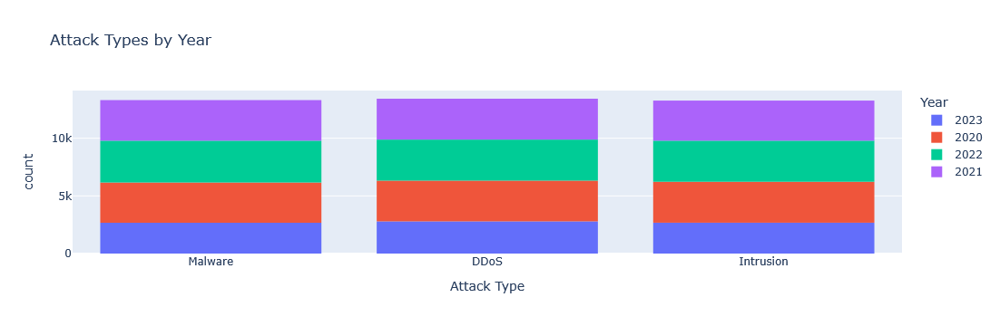

In [30]:
plt = px.histogram(data, x='Attack Type', color='Year', title='Attack Types by Year')
plt.show()


    In 2020 Intrusion attacks were the most frequent
    In 2021 and 2023 DDoS attacks were the most frequent
    In 2022 Malware attacks were the most frequent

In [28]:
data.groupby(['Year'])['Attack Type'].value_counts()

Year  Attack Type
2020  Intrusion      3551
      DDoS           3533
      Malware        3489
2021  DDoS           3545
      Malware        3518
      Intrusion      3475
2022  Malware        3629
      Intrusion      3563
      DDoS           3558
2023  DDoS           2792
      Intrusion      2676
      Malware        2671
Name: count, dtype: int64

In [45]:
data.groupby(['Year'])['Attack Type'].count()

Year
2020    10573
2021    10538
2022    10750
2023     8139
Name: Attack Type, dtype: int64

Least amount of attack types was in 2023.



In [46]:
month_attacks = data.groupby(['Month'])['Attack Type'].count()
month_attacks.sort_values(ascending=False)

Month
3     3678
7     3623
8     3615
6     3609
5     3595
9     3482
4     3421
1     3378
2     3232
10    2989
11    2703
12    2675
Name: Attack Type, dtype: int64

- the most attacks happened in March
- the least attacks happened in December

In [47]:
attack_types_month = data.groupby(['Month'])['Attack Type'].value_counts()
attack_types_month.sort_values(ascending=False)

Month  Attack Type
3      DDoS           1299
6      Intrusion      1268
7      Malware        1236
8      DDoS           1226
7      Intrusion      1224
9      DDoS           1221
8      Malware        1216
5      Intrusion      1212
       DDoS           1200
3      Malware        1197
6      DDoS           1190
5      Malware        1183
3      Intrusion      1182
8      Intrusion      1173
9      Malware        1172
4      DDoS           1166
7      DDoS           1163
1      Malware        1163
6      Malware        1151
4      Intrusion      1140
1      Intrusion      1116
4      Malware        1115
2      Intrusion      1107
1      DDoS           1099
9      Intrusion      1089
2      DDoS           1085
       Malware        1040
10     DDoS           1015
       Malware        1013
       Intrusion       961
11     Malware         935
       Intrusion       899
12     DDoS            895
       Intrusion       894
       Malware         886
11     DDoS            869
Name: cou

- in March was the most DDoS Attacks
- in June was the most Intrusion Attacks
- in July was the most Malware Attacks

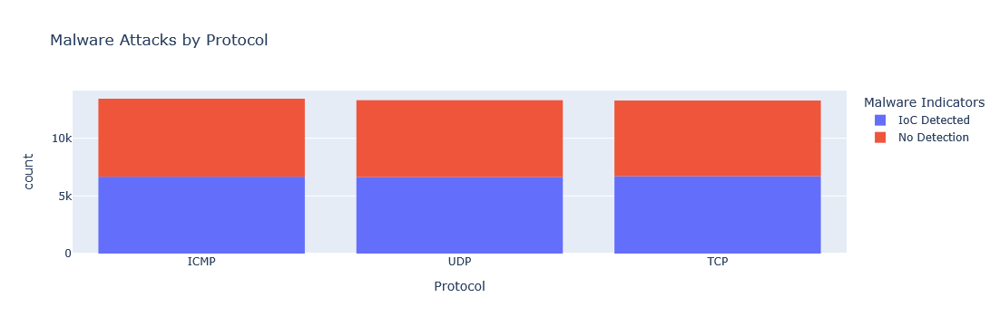

In [31]:
plt = px.histogram(data, x = 'Protocol', color = 'Malware Indicators', title = 'Malware Attacks by Protocol')
plt.show()

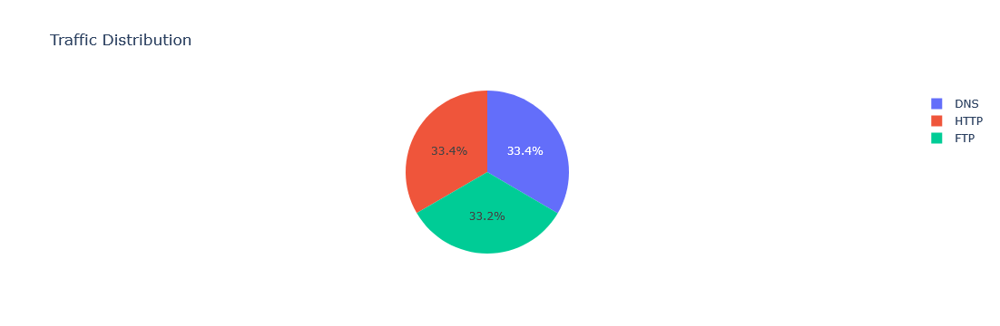

In [32]:
plt = px.pie(data, names = 'Traffic Type', title = 'Traffic Distribution')
plt.show()

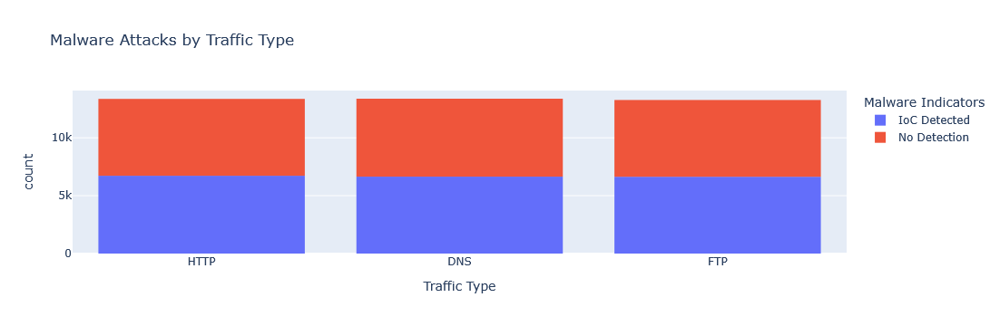

In [33]:
plt = px.histogram(data, x = 'Traffic Type', color = 'Malware Indicators', title = 'Malware Attacks by Traffic Type')
plt.show()

In [49]:
data.groupby(['Malware Indicators', 'Attack Type']).agg({'Packet Length':'mean'})

Packet Length
Malware Indicators Attack Type               
IoC Detected       DDoS            780.819958
                   Intrusion       787.093473
                   Malware         777.033678
No Detection       DDoS            789.797313
                   Intrusion       774.694545
                   Malware         779.070631

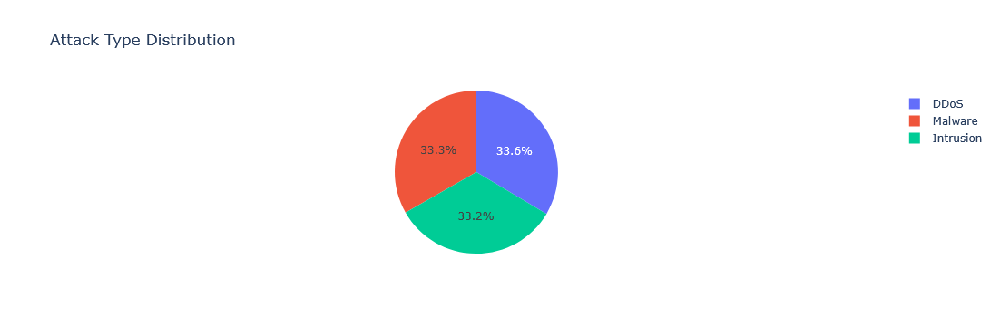

In [34]:
plt = px.pie(data, names = 'Attack Type', title = 'Attack Type Distribution')
plt.show()

In [50]:
data.groupby(['Malware Indicators'])['Attack Type'].value_counts()

Malware Indicators  Attack Type
IoC Detected        Malware        6681
                    Intrusion      6665
                    DDoS           6654
No Detection        DDoS           6774
                    Malware        6626
                    Intrusion      6600
Name: count, dtype: int64

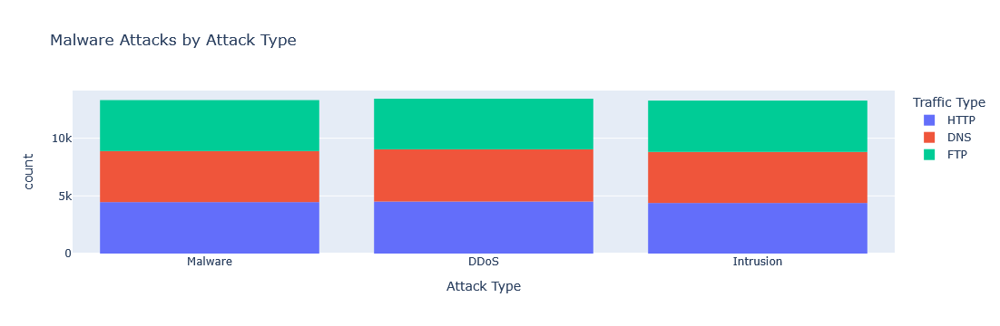

In [35]:
plt = px.histogram(data, x='Attack Type', color='Traffic Type', title='Malware Attacks by Attack Type')
plt.show()

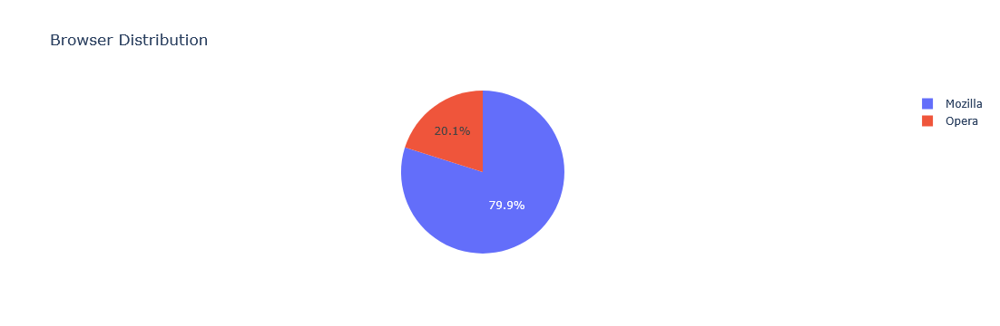

In [36]:
plt = px.pie(data, names = 'Browser', title = 'Browser Distribution')
plt.show()

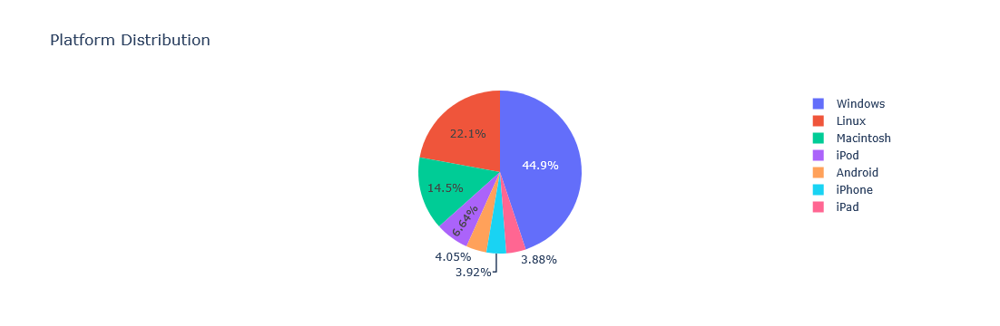

In [38]:
plt = px.pie(data, names = 'Device-OS', title = 'Platform Distribution')
plt.show()

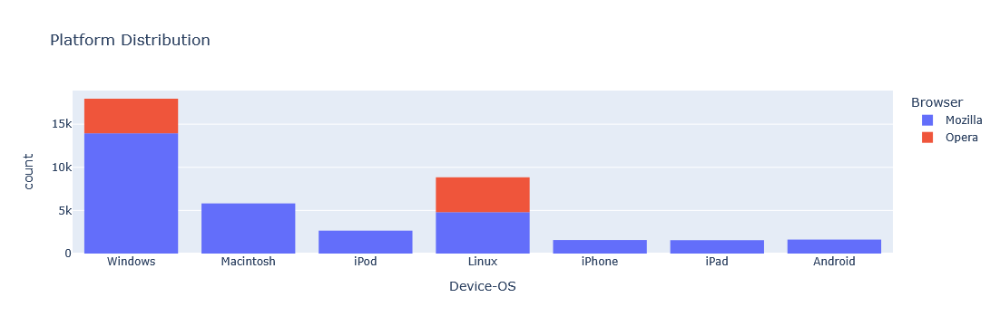

In [40]:
plt = px.histogram(data, x ='Device-OS', color= 'Browser', title = 'Platform Distribution')
plt.show()

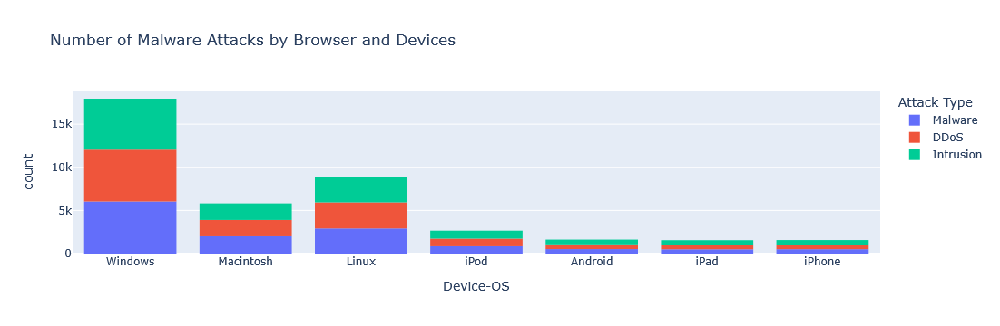

In [41]:
plt = px.histogram(data, x= 'Device-OS', color = 'Attack Type', title = 'Number of Malware Attacks by Browser and Devices')
plt.show()

In [48]:
packet_length = data.groupby(['Browser', 'Device-OS']).agg({'Packet Length':'mean'})
packet_length.sort_values('Packet Length',ascending=False)

Packet Length
Browser Device-OS               
Mozilla iPad          800.304320
Opera   Windows       788.932635
Mozilla Android       786.717284
        iPod          784.408886
        Macintosh     782.677963
        Windows       779.130513
Opera   Linux         778.100223
Mozilla iPhone        777.880664
        Linux         774.952907

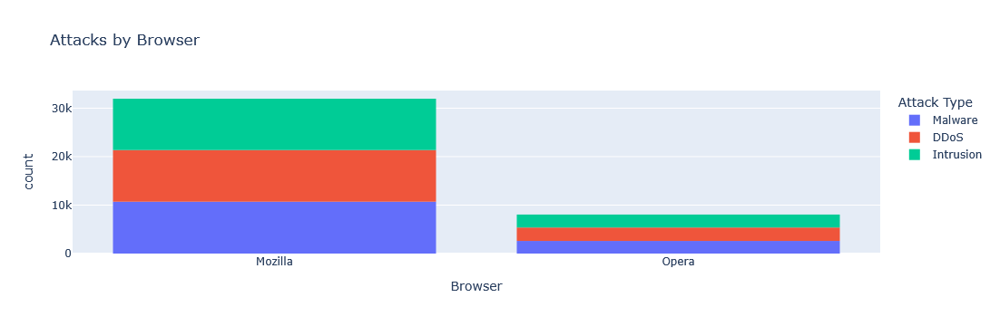

In [42]:
plt = px.histogram(data, x= 'Browser', color='Attack Type', title= 'Attacks by Browser')
plt.show()

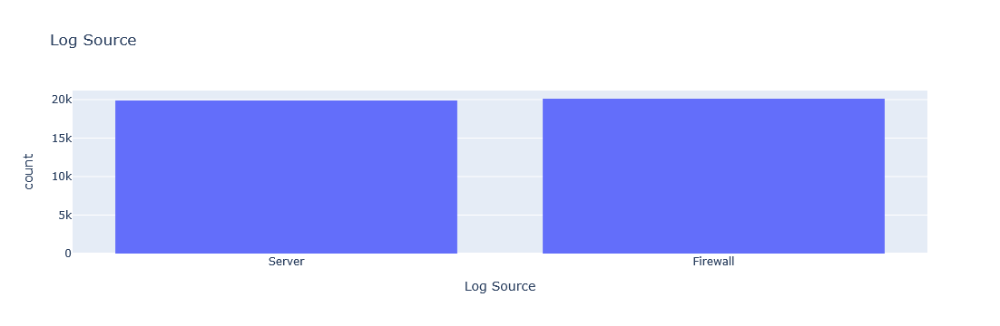

In [43]:
plt = px.histogram(data, x='Log Source', title='Log Source')
plt.show()

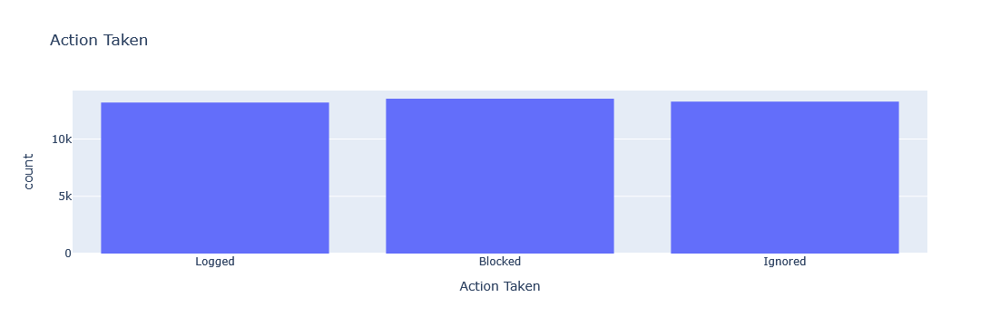

In [44]:
plt = px.histogram(data, x='Action Taken', title='Action Taken')
plt.show()

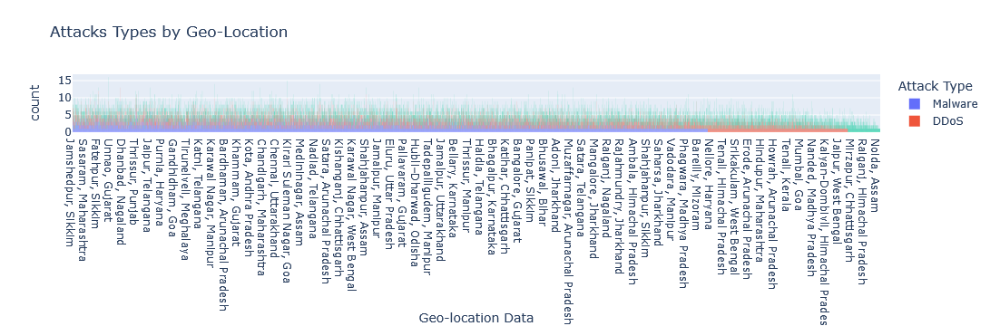

In [51]:
plt = px.histogram(data ,x='Geo-location Data', color = 'Attack Type', title = 'Attacks Types by Geo-Location')
plt.show()

In [52]:
locations = data.groupby(['Geo-location Data'])['Attack Type'].value_counts()
locations.sort_values(ascending=False).head(20)

Geo-location Data               Attack Type
Ghaziabad, Jharkhand            Intrusion      10
Aurangabad, Nagaland            Malware         9
Aligarh, Chhattisgarh           Malware         9
Yamunanagar, Arunachal Pradesh  Malware         8
Jalgaon, Mizoram                Malware         8
Amroha, Sikkim                  Intrusion       8
Panvel, Jharkhand               Intrusion       8
Srikakulam, Uttarakhand         Intrusion       8
Rampur, Gujarat                 Intrusion       8
Mysore, Rajasthan               Malware         7
Ahmednagar, Bihar               Intrusion       7
Sambhal, Goa                    Malware         7
Muzaffarnagar, Nagaland         Malware         7
Noida, Jharkhand                DDoS            7
Kadapa, Mizoram                 Intrusion       7
Saharanpur, Jharkhand           Intrusion       7
Bettiah, Chhattisgarh           Malware         7
Malda, Telangana                Malware         7
Junagadh, Telangana             DDoS            7
Malega